# 911 Emergency Calls

Names: Reze Alishahi, Barry Otieno, Taniwa Ndebele

4/24/2018

The dataset considered for this group project is going to be from 911 emergency calls from the website  Kaggle.com. The data consists of a total of 9 columns containing data pertaining to 911 calls which include; latitude, longitude, description, zip code, title, timeStamp, township, and address at which each call has taken place. The objectives of this project currently are as following:

In [1]:
import pandas as pd
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sb

In [2]:
df_source = pd.read_csv('911.csv')
df_source.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1


### Obj1_a) Explore the dataset

Show the information of the inserted csv file, data types in each column, numer of non null objects and number of columns and rows

In [3]:
df_source.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423909 entries, 0 to 423908
Data columns (total 9 columns):
lat          423909 non-null float64
lng          423909 non-null float64
desc         423909 non-null object
zip          371780 non-null float64
title        423909 non-null object
timeStamp    423909 non-null object
twp          423750 non-null object
addr         423909 non-null object
e            423909 non-null int64
dtypes: float64(3), int64(1), object(5)
memory usage: 29.1+ MB


In [4]:
df_source.shape

(423909, 9)

store the rows in which zip code is null in a seperate dataframe and show the head of this dataframe

In [5]:
zip_null = df_source[df_source['zip'].isnull()]
zip_null.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1
10,40.231990,-75.251891,RT202 PKWY & KNAPP RD; MONTGOMERY; 2015-12-10 ...,NaN,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:33:50,MONTGOMERY,RT202 PKWY & KNAPP RD,1
14,40.097222,-75.376195,SCHUYLKILL EXPY & CROTON RD UNDERPASS; UPPER M...,NaN,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:09:49,UPPER MERION,SCHUYLKILL EXPY & CROTON RD UNDERPASS,1
23,40.143326,-75.422819,RT422 & PAWLINGS RD OVERPASS; LOWER PROVIDENC...,NaN,Traffic: DISABLED VEHICLE -,2015-12-10 18:00:38,LOWER PROVIDENCE,RT422 & PAWLINGS RD OVERPASS,1
24,40.153268,-75.189558,SUMMIT AVE & RT309 UNDERPASS; UPPER DUBLIN; 20...,NaN,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:58:22,UPPER DUBLIN,SUMMIT AVE & RT309 UNDERPASS,1


In [6]:
len(zip_null)

52129

store the rows in which township is null in a seperate dataframe and show the head of this dataframe

In [7]:
twp_null = df_source[df_source['twp'].isnull()]
twp_null.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
1635,40.162804,-75.097848,TURNPIKE OVERPASS; ; 2015-12-14 @ 21:36:52-Sta...,19040.0,Fire: VEHICLE ACCIDENT,2015-12-14 21:36:52,NaN,TURNPIKE OVERPASS,1
1821,40.099265,-75.175706,CHURCH RD; ; Station 322; 2015-12-15 @ 11:31:36;,NaN,EMS: UNKNOWN MEDICAL EMERGENCY,2015-12-15 11:31:36,NaN,CHURCH RD,1
5455,40.222272,-75.138302,GIANT; ; 2015-12-24 @ 17:30:07-Station:STA98;,18976.0,Fire: VEHICLE ACCIDENT,2015-12-24 17:30:07,NaN,GIANT,1
7281,40.113516,-75.332257,HIGH ST; ; Station 329; 2015-12-30 @ 03:32:49;,19401.0,EMS: VEHICLE ACCIDENT,2015-12-30 03:32:49,NaN,HIGH ST,1
7282,40.113516,-75.332257,HIGH ST; ; 2015-12-30 @ 03:32:28-Station:STA58;,19401.0,Fire: VEHICLE ACCIDENT,2015-12-30 03:32:28,NaN,HIGH ST,1


In [8]:
len(twp_null)

159

store the rows in which address is null in a seperate dataframe and show the head of this dataframe

In [9]:
addr_null = df_source[df_source['addr'].isnull()]
addr_null.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e


Create a clean dataframe in which all columns are not null objects

In [10]:
df_source.index

RangeIndex(start=0, stop=423909, step=1)

In [11]:
df_clean_source = df_source[~df_source['zip'].isnull()]

In [12]:
df_clean_source = df_clean_source[~df_clean_source['twp'].isnull()]


In [13]:
df_clean_source = df_clean_source[~df_clean_source['addr'].isnull()]

In [14]:
df_clean_source

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1
5,40.253473,-75.283245,CANNON AVE & W 9TH ST; LANSDALE; Station 345;...,19446.0,EMS: HEAD INJURY,2015-12-10 15:39:04,LANSDALE,CANNON AVE & W 9TH ST,1
6,40.182111,-75.127795,LAUREL AVE & OAKDALE AVE; HORSHAM; Station 35...,19044.0,EMS: NAUSEA/VOMITING,2015-12-10 16:46:48,HORSHAM,LAUREL AVE & OAKDALE AVE,1
7,40.217286,-75.405182,COLLEGEVILLE RD & LYWISKI RD; SKIPPACK; Stati...,19426.0,EMS: RESPIRATORY EMERGENCY,2015-12-10 16:17:05,SKIPPACK,COLLEGEVILLE RD & LYWISKI RD,1
8,40.289027,-75.399590,MAIN ST & OLD SUMNEYTOWN PIKE; LOWER SALFORD;...,19438.0,EMS: SYNCOPAL EPISODE,2015-12-10 16:51:42,LOWER SALFORD,MAIN ST & OLD SUMNEYTOWN PIKE,1
9,40.102398,-75.291458,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD; PLYM...,19462.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:35:41,PLYMOUTH,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD,1
11,40.084161,-75.308386,BROOK RD & COLWELL LN; PLYMOUTH; 2015-12-10 @ ...,19428.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 16:32:10,PLYMOUTH,BROOK RD & COLWELL LN,1


In [15]:
len(df_clean_source)

371711

In [16]:
df_source['zip'].value_counts().head(10)

19401.0    28656
19464.0    27948
19403.0    21631
19446.0    20496
19406.0    14097
19002.0    13380
19468.0    12393
19046.0    11720
19454.0    11457
19090.0    11149
Name: zip, dtype: int64

In [17]:
df_source['desc'].value_counts().head(10)

WALDEN POND WAY & WOODVIEW LN; TOWAMENCIN; 2017-09-27 @ 17:54:55-Station:STA76;           4
GREEN ST & E BASIN ST;  NORRISTOWN; Station 308A; 2016-05-10 @ 20:23:26;                  4
GERMANTOWN PIKE; WORCESTER; 2017-09-27 @ 17:50:24-Station:STA83;                          4
SUSQUEHANNA RD & E BUTLER PIKE; UPPER DUBLIN; 2016-05-13 @ 12:15:59;                      3
N GULPH RD; UPPER MERION; 2015-12-12 @ 21:09:39-Station:STA47;                            3
ASTOR ST & W OAK ST;  NORRISTOWN; Station 308A; 2017-09-27 @ 17:44:37;                    3
HUNTINGDON RD & SUSQUEHANNA RD;  ABINGTON; Station 381; 2017-09-27 @ 17:58:40;            3
CONSHOHOCKEN STATE RD & E CITY AVE;  LOWER MERION; Station 313; 2016-05-13 @ 12:20:36;    2
DEKALB PIKE & CROCKETT RD; UPPER MERION; 2015-12-12 @ 20:19:43;                           2
LIBERTY AVE & W MARSHALL ST;  WEST NORRITON; Station 308B; 2016-03-12 @ 18:50:50;         2
Name: desc, dtype: int64

In [18]:
df_source['twp'].value_counts().head(10)

LOWER MERION        36441
ABINGTON            25835
NORRISTOWN          23883
UPPER MERION        22694
CHELTENHAM          19629
POTTSTOWN           17500
UPPER MORELAND      14707
LOWER PROVIDENCE    14025
PLYMOUTH            12800
UPPER DUBLIN        11910
Name: twp, dtype: int64

In [19]:
df_clean_source['addr'].value_counts().head(10)

SHANNONDELL DR & SHANNONDELL BLVD    4328
MAIN ST & OLD SUMNEYTOWN PIKE        1595
THE FAIRWAY  & RYDAL RD              1288
EVERGREEN RD & W LIGHTCAP RD         1020
EAGLEVILLE RD & SUNDERLAND DR        1006
GULPH RD & KIRK AVE                   946
BLACK ROCK RD & S TRAPPE RD           932
DAVISVILLE RD & PENNYPACK RD          883
GERMANTOWN PIKE & HANNAH AVE          847
BETHLEHEM PIKE & NORTH WALES RD       773
Name: addr, dtype: int64

### Obj1_b) What are the common causes (overall) for the emergency calls.

In [20]:
df_source['Reason'] = df_source['title'].apply(lambda title: title.split(':')[0])
df_source['Reason'].value_counts()

EMS        208676
Traffic    151458
Fire        63775
Name: Reason, dtype: int64

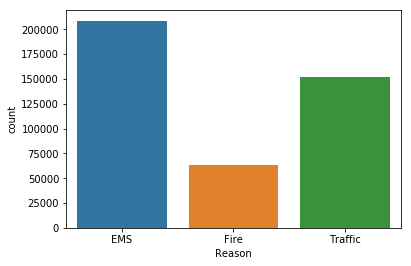

In [21]:
sb.countplot(x = 'Reason', data = df_source)

### Obj2) Visualize the number of calls vs each day hour, months, weekdays, and year. Also visualize the number of calls for each cause vs date and/or month.

First we should convert the timeStamp column to time stamp type, then create new columns from the timeStamp called Hour, Month, Weekday, Year:

In [22]:
df_source['timeStamp'] = pd.to_datetime(df_source['timeStamp'])

In [23]:
df_source['Year'] = df_source['timeStamp'].apply(lambda time: time.year)
df_source['Month'] = df_source['timeStamp'].apply(lambda time: time.month)
df_source['Day'] = df_source['timeStamp'].apply(lambda time: time.day)
df_source['Weekday'] = df_source['timeStamp'].apply(lambda time: time.dayofweek)
df_source['Hour'] = df_source['timeStamp'].apply(lambda time: time.hour)


In [27]:
df_source.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,Reason,Year,Month,Day,Weekday,Hour
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1,EMS,2015,12,10,3,17
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS,2015,12,10,3,17
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1,Fire,2015,12,10,3,17
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 17:40:01,NORRISTOWN,AIRY ST & SWEDE ST,1,EMS,2015,12,10,3,17
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 17:40:01,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1,EMS,2015,12,10,3,17


We see that the Weekday columns are represented by numbers, we prefer to convert it to Monday, Tuesday, etc... :

In [24]:
weekMap = {0:'Mon', 1:'Tue', 2: 'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
df_source['Weekday'] = df_source['Weekday'].map(weekMap)

In [29]:
df_source.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,Reason,Year,Month,Day,Weekday,Hour
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1,EMS,2015,12,10,Thu,17
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS,2015,12,10,Thu,17
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1,Fire,2015,12,10,Thu,17
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 17:40:01,NORRISTOWN,AIRY ST & SWEDE ST,1,EMS,2015,12,10,Thu,17
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 17:40:01,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1,EMS,2015,12,10,Thu,17


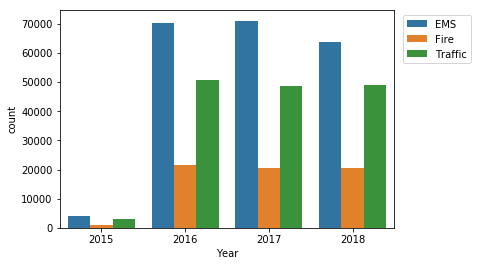

In [25]:
sb.countplot(x = 'Year', data = df_source, hue = 'Reason')

plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)

Count of emergency calls by categorie vs Days of the month

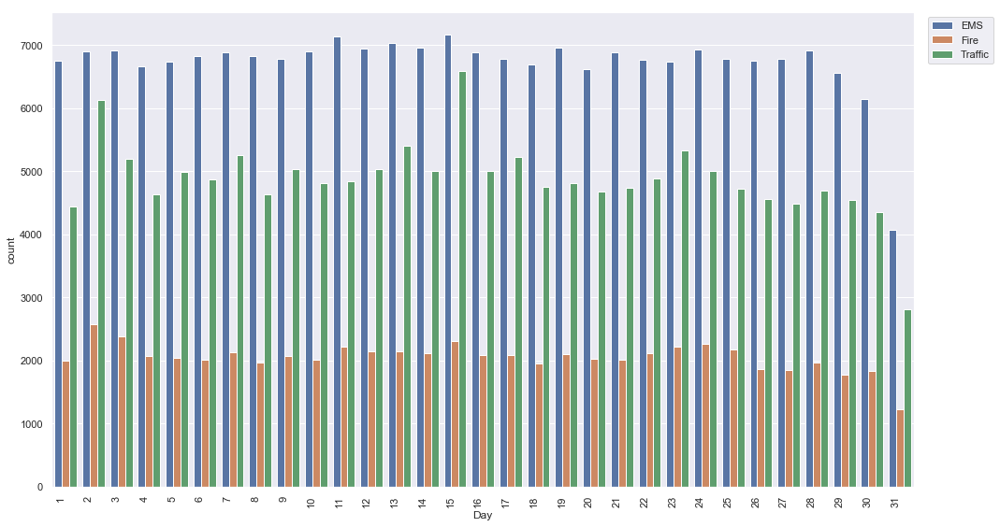

In [27]:
ax = sb.countplot(x = 'Day', data = df_source, hue = 'Reason')
sb.set(rc={'figure.figsize':(15,8)})
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)
plt.tight_layout()

Count of emergency calls by categorie vs Month

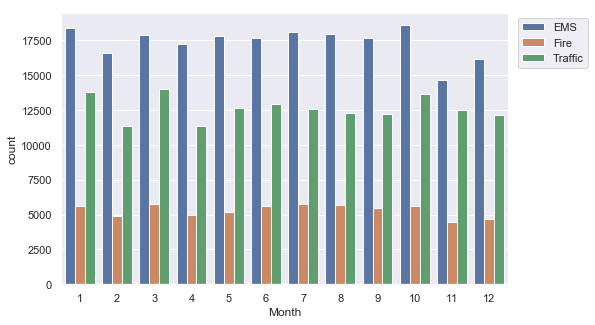

In [29]:
sb.countplot(x = 'Month', data=df_source, hue = 'Reason')
sb.set(rc={'figure.figsize':(8,5)})
plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)

Count of emergency calls by categorie vs hours of the day

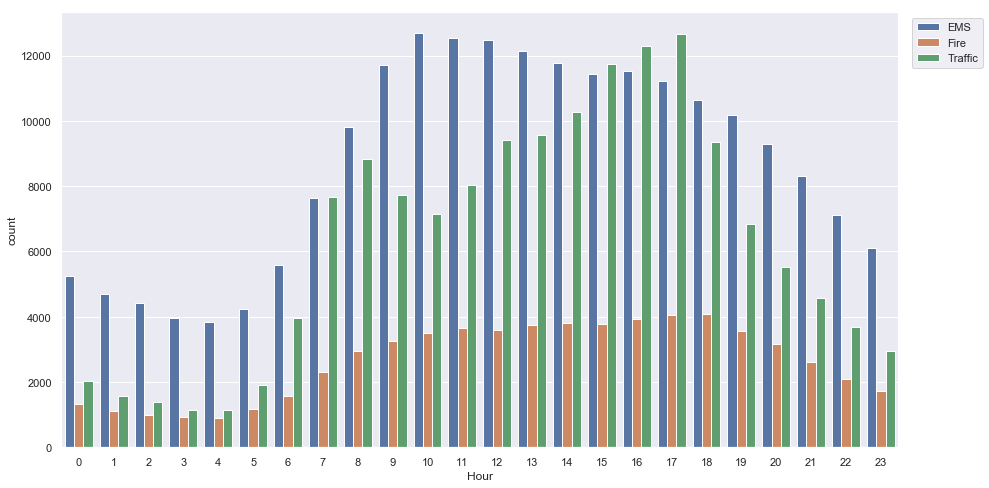

In [31]:
ax = sb.countplot(x = 'Hour', data=df_source, hue = 'Reason')
sb.set(rc={'figure.figsize':(15,8)})
plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)

Count of emergency calls by categorie vs Weekdays

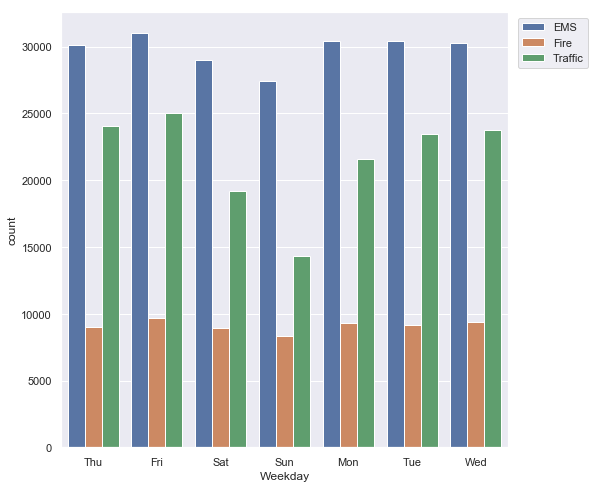

In [33]:
ax = sb.countplot(x = 'Weekday', data=df_source, hue = 'Reason')
sb.set(rc={'figure.figsize':(8,8)})
plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)

### Obj3) Use heatmap to find at which hours of days most and least calls occur, also which weekday of month.

First we have to slice and reformat portions of the source dataframe in order to be able to generate these heatmaps

In [34]:
day_vs_hour = df_source.groupby(by=['Weekday', 'Hour'])['Reason'].count().unstack()
day_vs_hour = day_vs_hour.reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
day_vs_hour

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Weekday,,,,,,,,,,,,,,,,,,,,,
Mon,1207,974,857,784,871,1124,1729,2829,3588,3685,...,3547,3975,4063,4003,3512,2821,2418,2005,1698,1283
Tue,1086,918,812,783,824,1075,1806,2912,3650,3563,...,3831,4087,4265,4396,3753,2960,2535,2147,1705,1350
Wed,1022,952,808,795,711,1040,1763,3060,3566,3528,...,3933,4149,4443,4487,3609,2927,2645,2236,1794,1399
Thu,1115,873,920,775,784,1091,1801,2913,3468,3457,...,3904,4139,4053,4412,3578,2923,2579,2230,1784,1486
Fri,1185,1001,930,832,821,1051,1676,2689,3185,3295,...,4150,4514,4711,4489,3616,3254,2789,2445,2210,1866
Sat,1515,1332,1206,1012,936,985,1230,1640,2211,2766,...,3479,3284,3348,3274,3174,3036,2632,2432,2073,1913
Sun,1520,1331,1263,1033,954,941,1119,1568,1933,2421,...,2992,2828,2855,2872,2829,2679,2362,1994,1632,1470


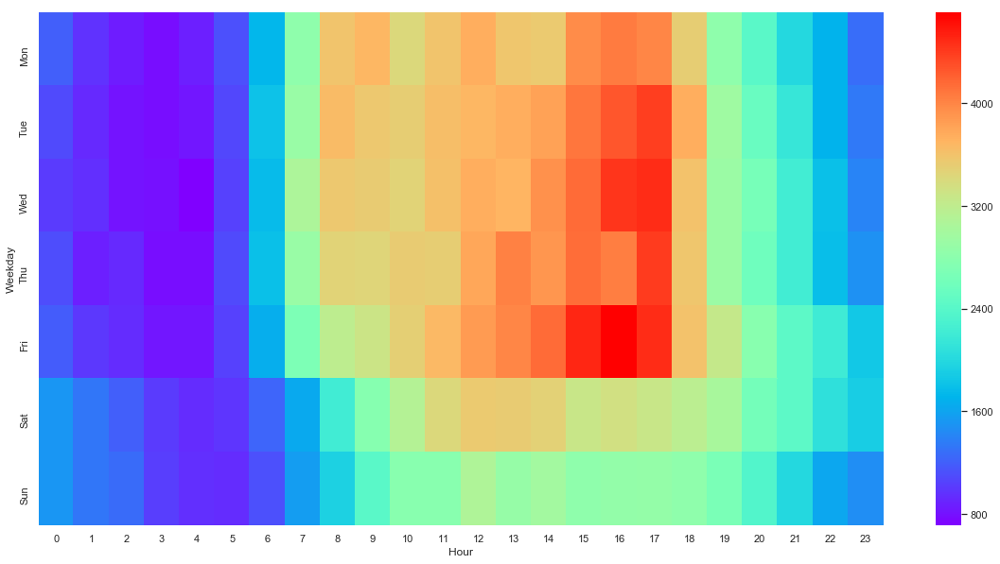

In [35]:
plt.figure(figsize=(20,10))
sb.heatmap(day_vs_hour, cmap='rainbow')
sb.set(font_scale=1.1)

In [36]:
weekday_vs_month = df_source.groupby(by=['Weekday', 'Month'])['Reason'].count().unstack(-1)
weekday_vs_month = weekday_vs_month.reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
weekday_vs_month

Month,1,2,3,4,5,6,7,8,9,10,11,12
Weekday,,,,,,,,,,,,
Mon,5716,5214,4663,5154,5019,5045,5792,5212,4675,6385,4157,4286
Tue,6118,4755,5090,4413,6203,5013,5488,5690,4930,5827,4823,4691
Wed,5488,5066,6076,4609,5749,5408,4794,6112,5156,5581,4907,4477
Thu,4985,4708,6010,4637,5469,5951,4954,5328,5300,4940,5978,4899
Fri,5532,4848,7344,5195,4989,5867,5380,5312,6010,5179,4525,5570
Sat,5103,4431,4914,4947,4275,4868,4883,4355,5023,5051,4043,5200
Sun,4882,3806,3569,4628,3940,4019,5114,3963,4245,4852,3210,3896


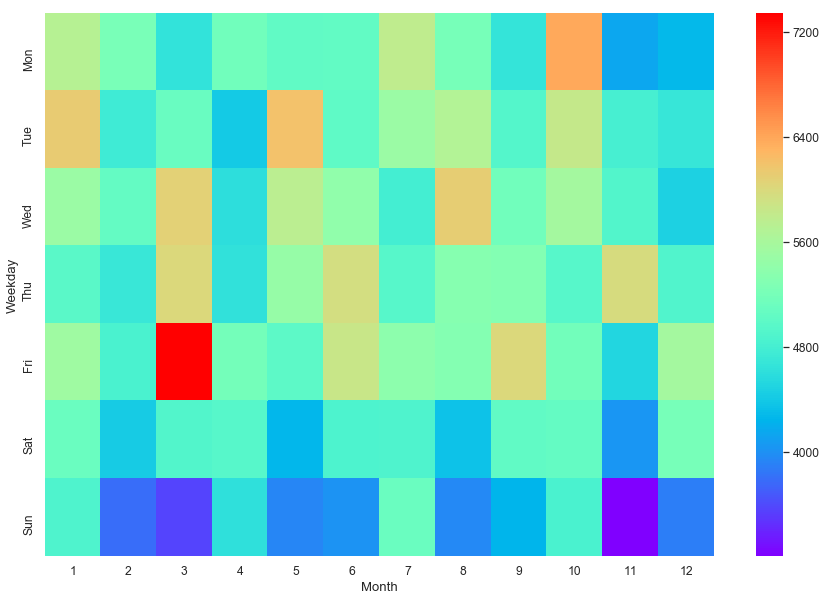

In [37]:
plt.figure(figsize=(15,10))
sb.heatmap(weekday_vs_month, cmap='rainbow')
sb.set(font_scale=1.1)

### Obj4) Imagine the best neighborhoods (zip codes) are the ones with less than 10 calls, find them and visualize them. Also, put the name of the neighborhoods corresponding to those zip codes in an array and print them out as sorted in ascending manner.

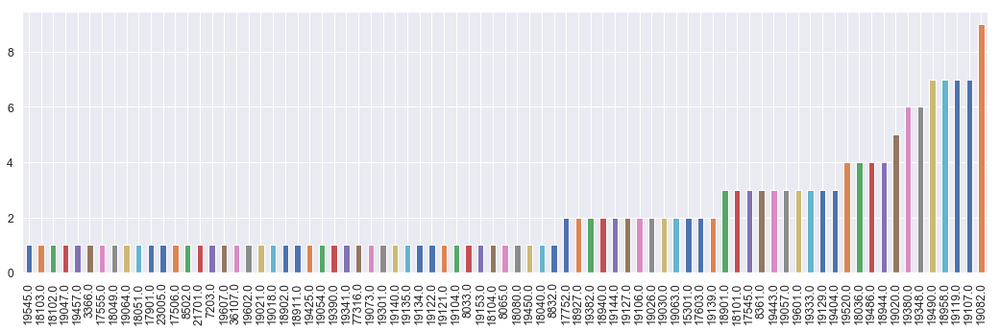

In [45]:
f, ax = plt.subplots(figsize=(18,5))
zip_counts = df_source['zip'].value_counts()
safe_zones = zip_counts[zip_counts < 10]
safe_zones = safe_zones.sort_values()
safe_zones.plot.bar()



### Obj5) Use heatmap to find at which hours of weekdays most accidents occur among all zipcodes

In [46]:
df_tmp = df_source

In [47]:
df_tmp['Cause'] = df_tmp['title'].apply(lambda x : x.split(':')[1].replace(" -", ""))

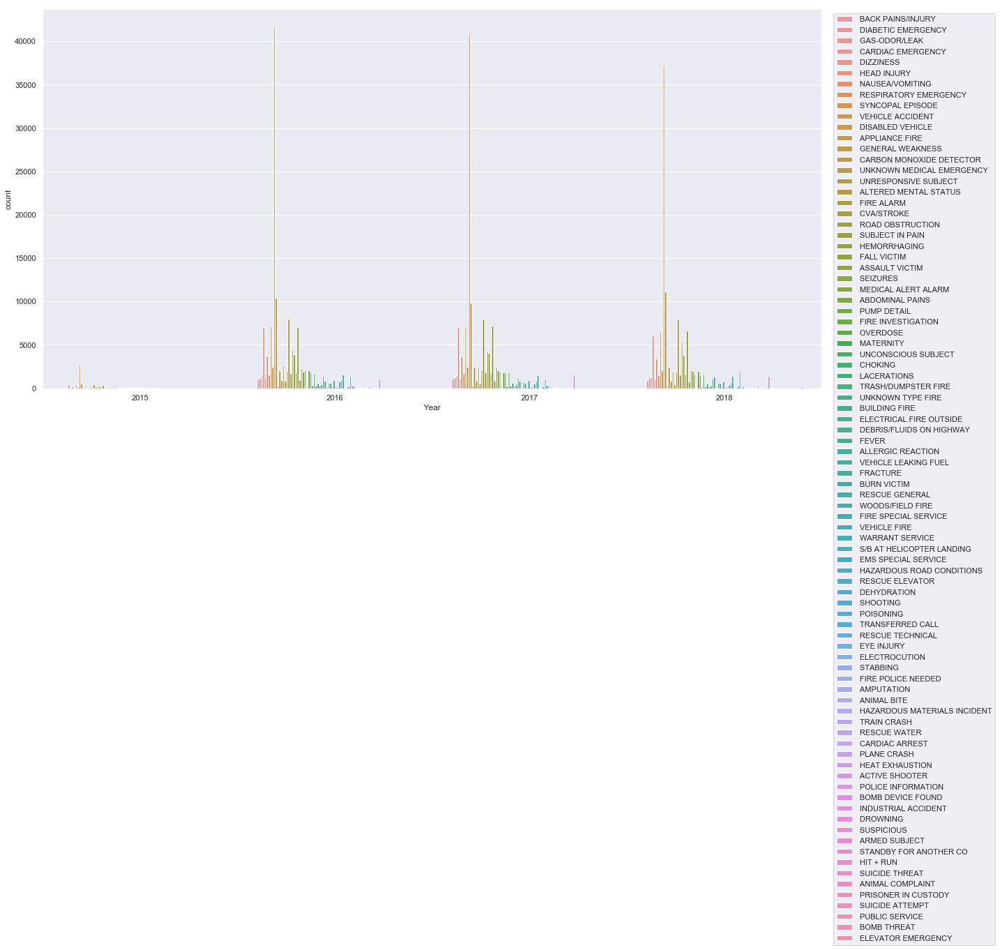

In [51]:
sb.set(rc={'figure.figsize':(20,10)})
sb.countplot(x = 'Year', data = df_tmp, hue = 'Cause')
plt.legend(bbox_to_anchor = (1.01, 1), loc = 2)


In [52]:
Cause_count = df_tmp.groupby('Cause')['Cause'].count()

In [53]:
Cause_count.sort_values(ascending=False).head(10)

Cause
 VEHICLE ACCIDENT             122482
 DISABLED VEHICLE              31877
 FIRE ALARM                    24459
 FALL VICTIM                   21258
 RESPIRATORY EMERGENCY         21159
 CARDIAC EMERGENCY             20620
 ROAD OBSTRUCTION              14134
 SUBJECT IN PAIN               12004
 HEAD INJURY                   11105
 UNKNOWN MEDICAL EMERGENCY      7171
Name: Cause, dtype: int64

In [54]:
df_accident = df_tmp[df_tmp['Cause'] == ' VEHICLE ACCIDENT']

In [55]:
df_accident['zip'].value_counts().head(20)

19401.0    5790
19464.0    5382
19446.0    5147
19403.0    4726
19406.0    4221
19002.0    3768
19454.0    3708
19468.0    3540
19090.0    3283
19426.0    3097
19006.0    2852
19046.0    2796
19038.0    2694
19428.0    2605
19462.0    2545
19422.0    2497
19040.0    2184
19027.0    2125
19044.0    2091
19438.0    2030
Name: zip, dtype: int64

In [56]:
acc_weekday_vs_hour = df_accident.groupby(by=['Weekday', 'Hour'])['Cause'].count().unstack()
acc_weekday_vs_hour = acc_weekday_vs_hour.reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
acc_weekday_vs_hour

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Weekday,,,,,,,,,,,,,,,,,,,,,
Mon,188,110,96,80,100,239,573,1065,1224,986,...,1108,1451,1531,1588,1120,649,536,411,304,200
Tue,135,105,69,87,119,230,629,1194,1431,993,...,1285,1604,1788,1851,1405,824,602,510,304,205
Wed,145,107,88,97,66,234,593,1316,1394,1019,...,1285,1549,1792,1893,1291,818,595,471,323,227
Thu,144,84,143,91,115,240,611,1154,1346,1004,...,1260,1531,1572,1952,1278,784,593,563,322,299
Fri,170,145,140,99,94,207,551,1020,1057,958,...,1413,1881,2002,1792,1187,919,656,537,537,424
Sat,314,283,267,193,161,181,223,336,459,706,...,1239,1056,1003,919,893,742,561,543,460,420
Sun,297,249,302,185,160,154,210,279,312,444,...,919,809,829,723,682,609,457,333,289,285


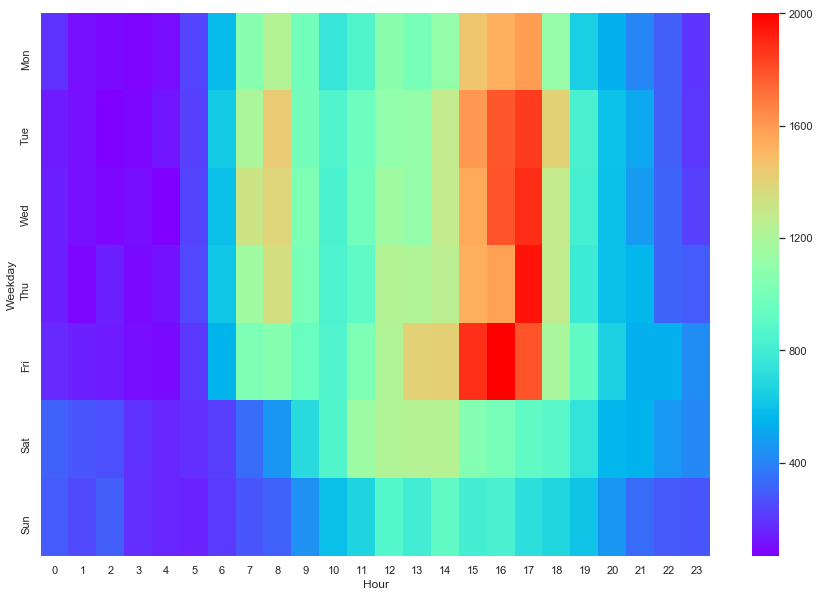

In [57]:
plt.figure(figsize=(15,10))
sb.heatmap(acc_weekday_vs_hour, cmap='rainbow')
sb.set(font_scale=1.1)

### Obj6) Find top 20 zip codes with highest number of accidents then use heatmap to find peak accident hours/weekdays of the week.

In [59]:
top_20_acc = df_accident['zip'].value_counts().head(20)
df_t20_acc = df_accident[df_accident['zip'].isin(list(top_20_acc.keys()))]
df_t20_acc.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,Reason,Year,Month,Day,Weekday,Hour,Cause
9,40.102398,-75.291458,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD; PLYM...,19462.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:35:41,PLYMOUTH,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD,1,Traffic,2015,12,10,Thu,17,VEHICLE ACCIDENT
11,40.084161,-75.308386,BROOK RD & COLWELL LN; PLYMOUTH; 2015-12-10 @ ...,19428.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 16:32:10,PLYMOUTH,BROOK RD & COLWELL LN,1,Traffic,2015,12,10,Thu,16,VEHICLE ACCIDENT
12,40.174131,-75.098491,BYBERRY AVE & S WARMINSTER RD; UPPER MORELAND;...,19040.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:15:49,UPPER MORELAND,BYBERRY AVE & S WARMINSTER RD,1,Traffic,2015,12,10,Thu,17,VEHICLE ACCIDENT
13,40.062974,-75.135914,OLD YORK RD & VALLEY RD; CHELTENHAM; 2015-12-1...,19027.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:12:47,CHELTENHAM,OLD YORK RD & VALLEY RD,1,Traffic,2015,12,10,Thu,17,VEHICLE ACCIDENT
18,40.114239,-75.338508,PENN ST & ARCH ST; NORRISTOWN; Station 308A; ...,19401.0,EMS: VEHICLE ACCIDENT,2015-12-10 17:43:29,NORRISTOWN,PENN ST & ARCH ST,1,EMS,2015,12,10,Thu,17,VEHICLE ACCIDENT


In [60]:
t20acc_weekday_vs_hour = df_t20_acc.groupby(by=['Weekday','Hour'])['Cause'].count().unstack()
t20acc_weekday_vs_hour = t20acc_weekday_vs_hour.reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
t20acc_weekday_vs_hour

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Weekday,,,,,,,,,,,,,,,,,,,,,
Mon,88,67,46,37,32,112,280,550,657,541,...,622,844,867,889,618,351,306,234,148,100
Tue,58,48,39,37,54,112,297,651,718,546,...,730,905,972,1014,790,472,306,293,164,131
Wed,81,52,39,44,32,101,293,731,766,582,...,754,913,1032,1058,708,461,356,270,194,118
Thu,64,51,61,43,58,109,291,616,760,572,...,726,821,902,1059,736,397,353,308,159,145
Fri,101,75,92,52,61,93,272,572,581,548,...,811,1017,1074,952,648,500,363,283,279,219
Sat,151,133,130,77,90,95,88,152,228,405,...,691,561,545,534,493,401,328,304,233,230
Sun,147,132,160,90,63,69,76,112,148,234,...,494,431,450,400,325,296,236,181,130,137


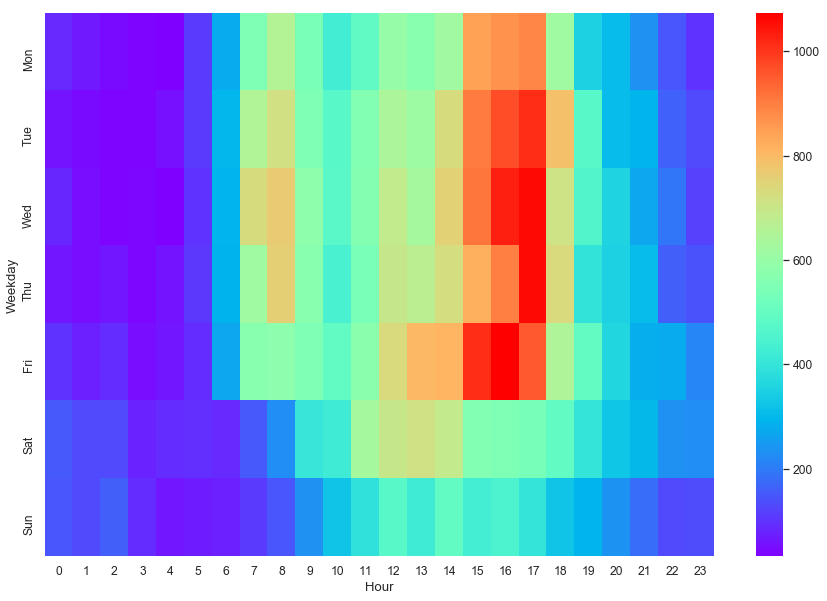

In [62]:
plt.figure(figsize=(15,10))
sb.heatmap(t20acc_weekday_vs_hour, cmap='rainbow')
sb.set(font_scale=1.1)

In [63]:
df_t20_acc['zip'].value_counts()

19401.0    5790
19464.0    5382
19446.0    5147
19403.0    4726
19406.0    4221
19002.0    3768
19454.0    3708
19468.0    3540
19090.0    3283
19426.0    3097
19006.0    2852
19046.0    2796
19038.0    2694
19428.0    2605
19462.0    2545
19422.0    2497
19040.0    2184
19027.0    2125
19044.0    2091
19438.0    2030
Name: zip, dtype: int64

# Objective 7 - 11

In [13]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import calendar
import operator

import os
import conda

from collections import Counter
from collections import defaultdict
from datetime import date
from mpl_toolkits.basemap import Basemap

#Conda FIle Directory Variables for Correct Mapping
conda_file_dir = conda.__file__
conda_dir = conda_file_dir.split('lib')[0]
proj_lib = os.path.join(os.path.join(conda_dir, 'share'), 'proj')
os.environ["PROJ_LIB"] = proj_lib

df = pd.read_csv('911.csv')

#Set Font Size
plt.rcParams['font.size'] = 16.0
df

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1
5,40.253473,-75.283245,CANNON AVE & W 9TH ST; LANSDALE; Station 345;...,19446.0,EMS: HEAD INJURY,2015-12-10 15:39:04,LANSDALE,CANNON AVE & W 9TH ST,1
6,40.182111,-75.127795,LAUREL AVE & OAKDALE AVE; HORSHAM; Station 35...,19044.0,EMS: NAUSEA/VOMITING,2015-12-10 16:46:48,HORSHAM,LAUREL AVE & OAKDALE AVE,1
7,40.217286,-75.405182,COLLEGEVILLE RD & LYWISKI RD; SKIPPACK; Stati...,19426.0,EMS: RESPIRATORY EMERGENCY,2015-12-10 16:17:05,SKIPPACK,COLLEGEVILLE RD & LYWISKI RD,1
8,40.289027,-75.399590,MAIN ST & OLD SUMNEYTOWN PIKE; LOWER SALFORD;...,19438.0,EMS: SYNCOPAL EPISODE,2015-12-10 16:51:42,LOWER SALFORD,MAIN ST & OLD SUMNEYTOWN PIKE,1
9,40.102398,-75.291458,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD; PLYM...,19462.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:35:41,PLYMOUTH,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD,1


# Objective 7: 
Plot geographic map coordinates(latitude, longitude) detailing different types of calls for regions based on colors

In [2]:
#Cooordinate Storage Longitude Latitude
latsEMS = []
lonsEMS = []

latsTraffic = []
lonsTraffic = []

latsFire = []
lonsFire = []

latsTotal = []
lonsTotal = []

#Collect info to df
for row in df.index:
    value = df.loc[row]["title"]
    cat = value[:value.find(":")]
    lat = float(df.loc[row]["lat"])
    lon = float(df.loc[row]["lng"])
    if cat == 'EMS':
        latsEMS.append(lat)
        lonsEMS.append(lon)
    elif cat == 'Traffic':
        latsTraffic.append(lat)
        lonsTraffic.append(lon)
    else:
        latsFire.append(lat)
        lonsFire.append(lon)
        
    latsTotal.append(lat)
    lonsTotal.append(lon)

In [3]:
#Set colors and symbols for plots
symbol = '.'
weight = 15   

Total


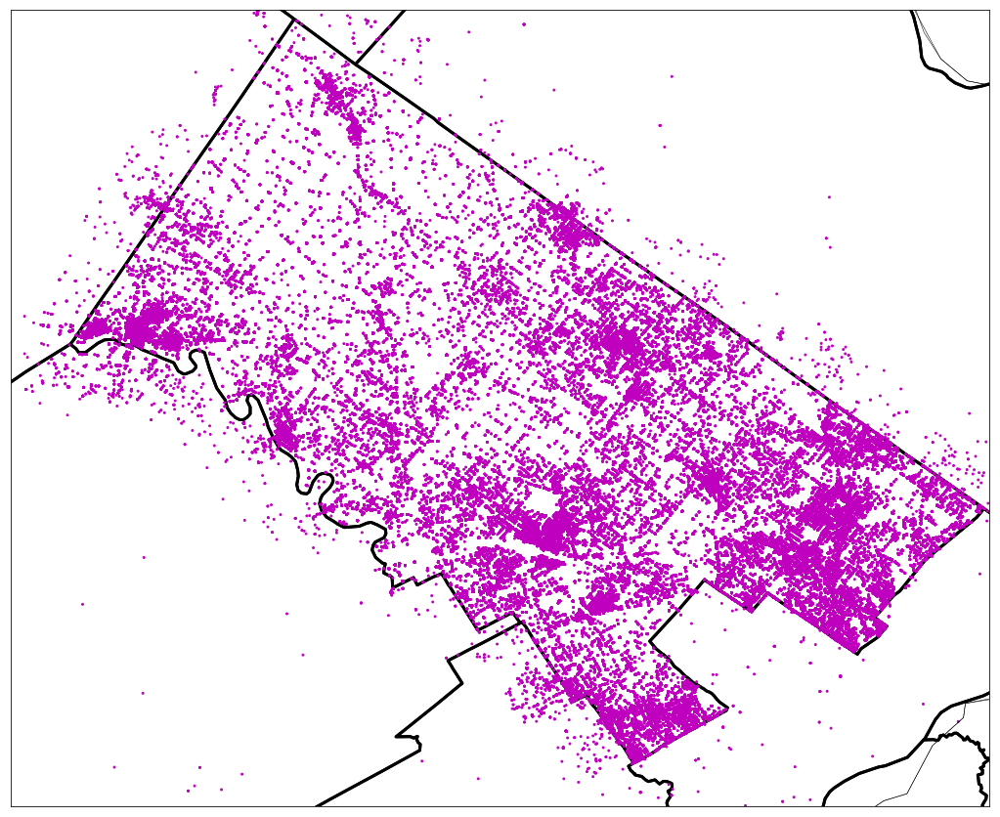

In [6]:
print("Total")
plt.figure(figsize=(30,15))
m = Basemap(projection='mill',
            llcrnrlat = 39.949406,
            llcrnrlon = -75.741462,
            urcrnrlat = 40.452937,
            urcrnrlon = -75.010691,
            resolution = 'h'
           )

m.drawcoastlines()
m.drawstates()
m.drawcounties(linewidth=3)

x, y = m(lonsTotal, latsTotal)
s = [ weight for _ in range(len(lonsTotal))]
m.scatter(x, y, marker=symbol,color='m', s = s)
plt.show()

Fire


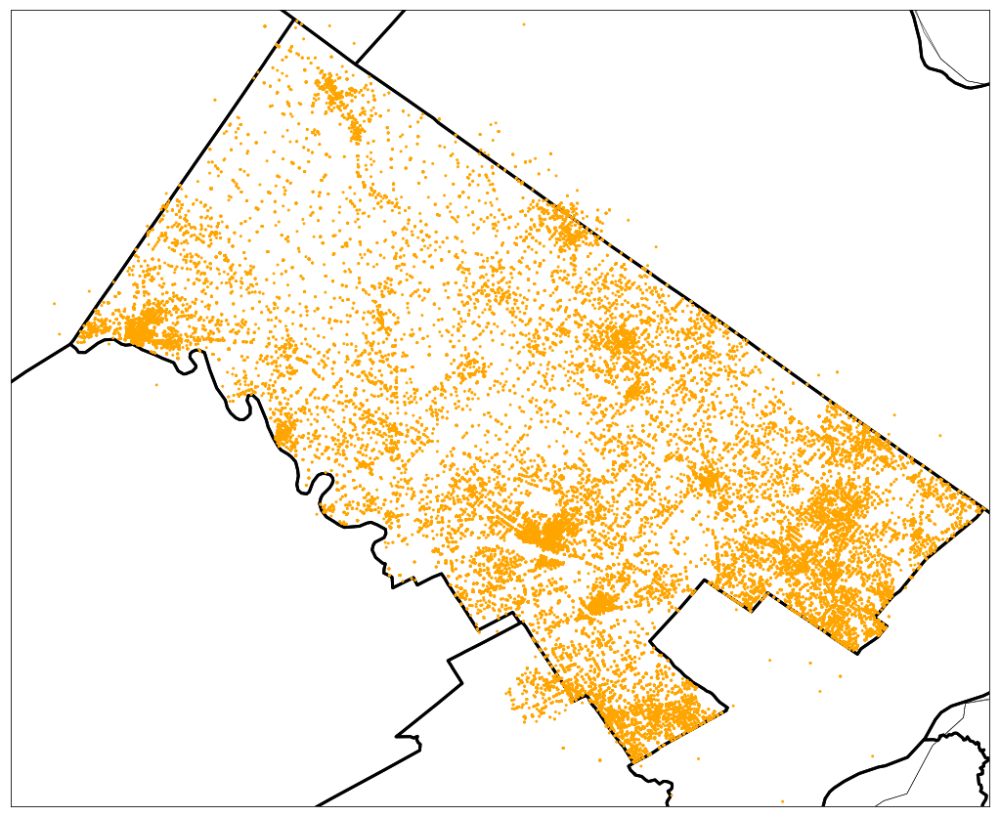

In [7]:
print("Fire")
plt.figure(figsize=(30,15))
m = Basemap(projection='mill',
            llcrnrlat = 39.949406,
            llcrnrlon = -75.741462,
            urcrnrlat = 40.452937,
            urcrnrlon = -75.010691,
            resolution = 'h'
           )

m.drawcoastlines()
m.drawstates()
m.drawcounties(linewidth=3)
        
s = [weight for i in range(len(latsFire))]
x, y = m(lonsFire, latsFire)
m.scatter(x, y, marker=symbol,color='orange',s=s)
plt.show()

Traffic


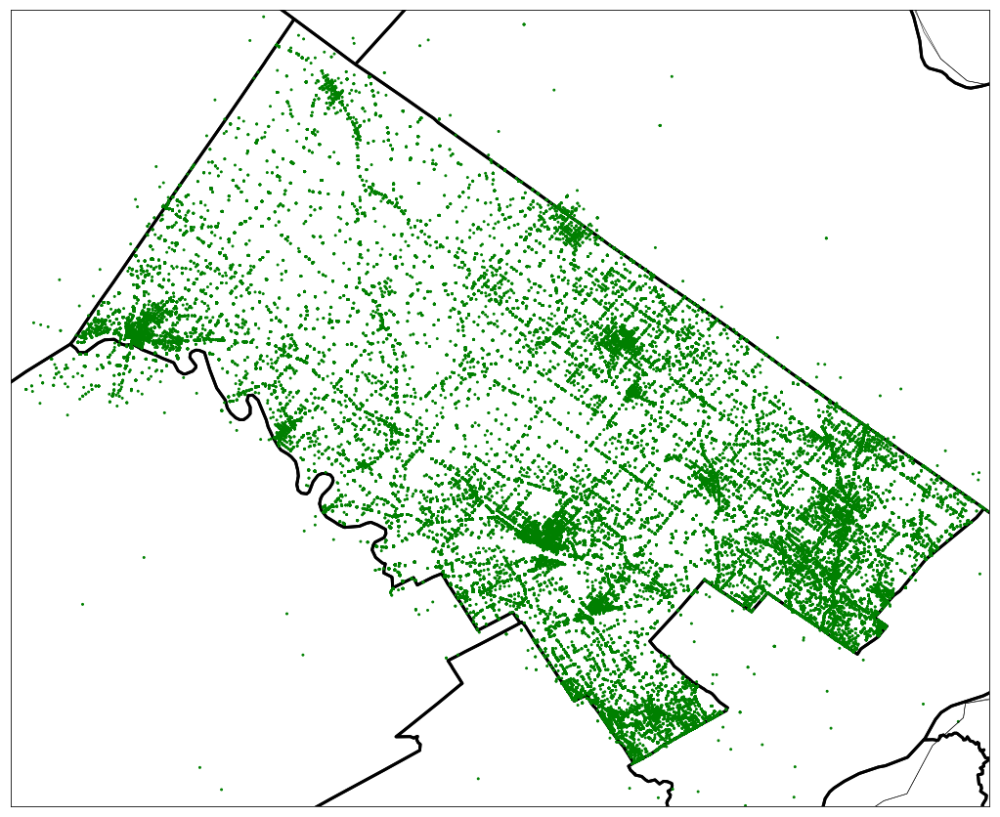

In [8]:
print("Traffic")

plt.figure(figsize=(30,15))
m = Basemap(projection='mill',
            llcrnrlat = 39.949406,
            llcrnrlon = -75.741462,
            urcrnrlat = 40.452937,
            urcrnrlon = -75.010691,
            resolution = 'h'
           )

m.drawcoastlines()
m.drawstates()
m.drawcounties(linewidth=3)
        
s = [weight for i in range(len(lonsTraffic))]
x, y = m(lonsTraffic, latsTraffic)
m.scatter(x, y, marker=symbol,color='green', s=s)
plt.show()

EMS


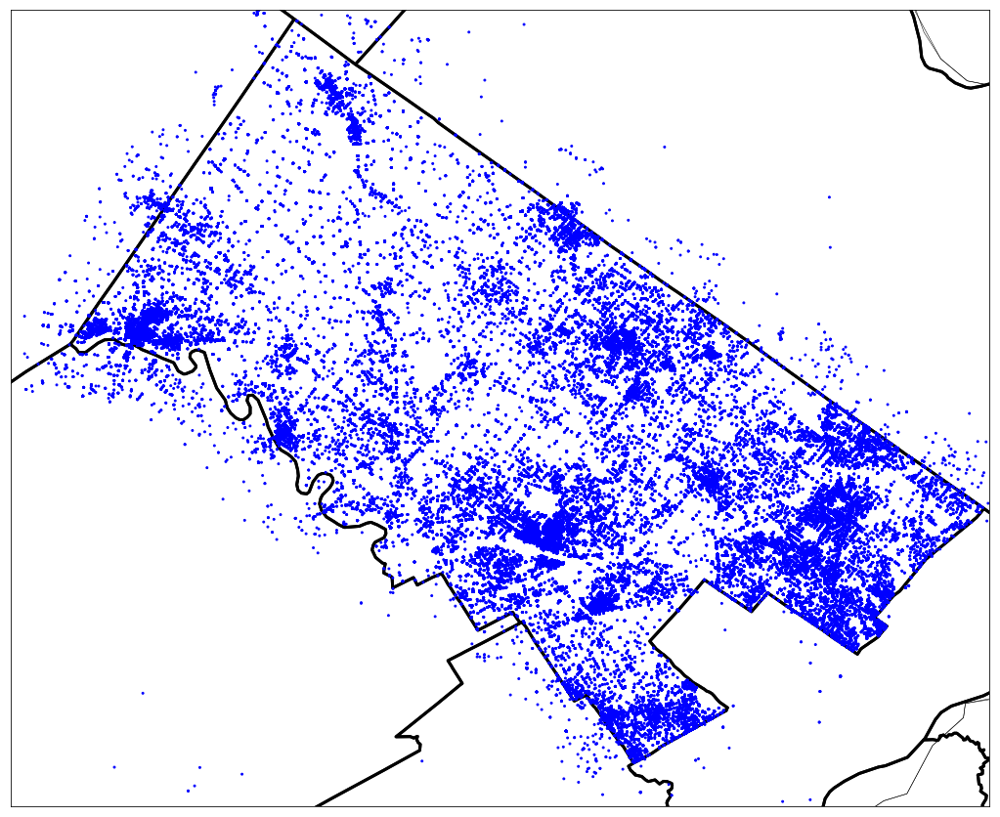

In [9]:
print("EMS")

plt.figure(figsize=(30,15))
m = Basemap(projection='mill',
            llcrnrlat = 39.949406,
            llcrnrlon = -75.741462,
            urcrnrlat = 40.452937,
            urcrnrlon = -75.010691,
            resolution = 'h'
           )

m.drawcoastlines()
m.drawstates()
m.drawcounties(linewidth=3)
        
s = [weight for i in range(len(latsEMS))]
x, y = m(lonsEMS, latsEMS)
m.scatter(x, y, marker=symbol,color='blue',s=s)

# Objective 8: 
Create piechart showing distribution of calls per main category throughout the region

In [10]:
#Keeps count of cat types
totals = Counter()
#Piechart variables labels == category name, sizes == category count
labels = []
sizes = []

for row in df.index:
    value = df.loc[row]["title"]
    totals[value[:value.find(":")]] += 1

for key in totals:
    labels.append(key)
    sizes.append(totals[key])

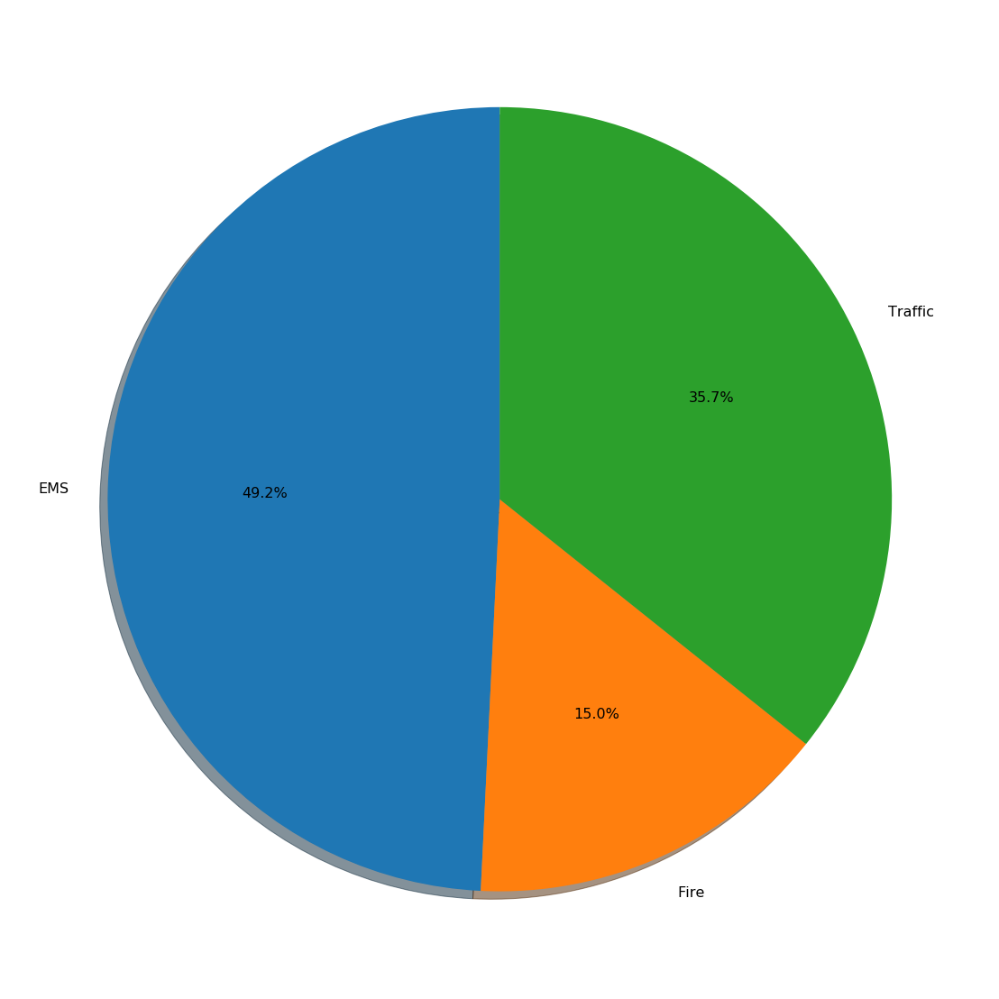

In [14]:
#Create pie chart
plt.figure(figsize=(30,20))
plt.pie(sizes, labels=labels, autopct='%1.1f%%',shadow=True, startangle=90)

plt.show()

# Objective 9: 
Show the total amount of emergency calls by category in a bar graph

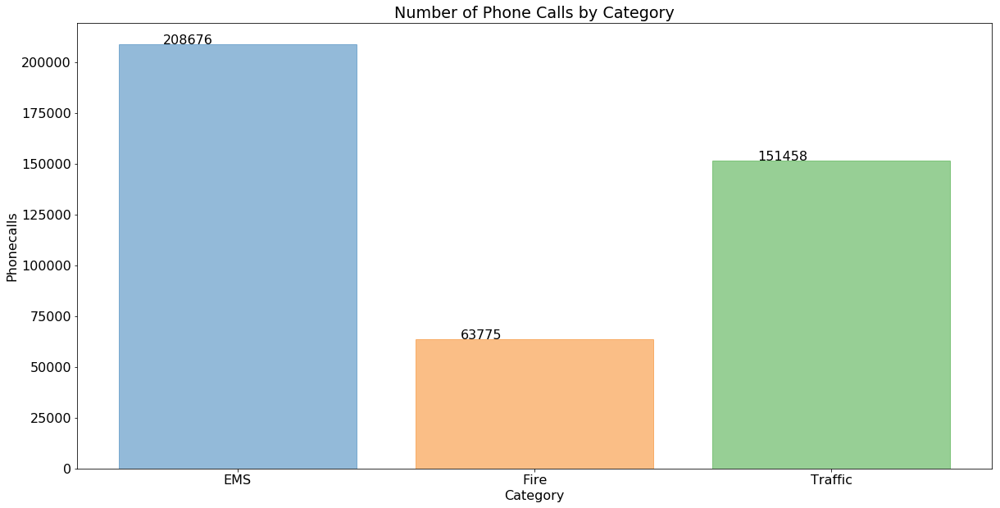

In [15]:
#Bar graph info
y_pos = np.arange(len(totals))
clrs = ["#2877B4", "#F67E0F", "#31A02C"]
plt.figure(figsize=(20,10))
barlist = plt.bar(y_pos, sizes, align='center', alpha=0.5)
plt.xticks(y_pos, labels)
plt.ylabel('Phonecalls')
plt.xlabel('Category')
plt.title('Number of Phone Calls by Category')
xlocs, xlabs = plt.xticks()

#Add total amount to bar graph
for i, v in enumerate(sizes):
    plt.text(xlocs[i] - 0.25, v + 0.01, str(v))
    barlist[i].set_color(clrs[i])
plt.savefig('numberofcalls.png')

plt.show()


# Objective 10: 
Create piechart for each weekday to display types of emergency calls expected per weekday.

In [16]:
#row['timeStamp'][0:4] === Year
#row['timeStamp'][5:7] === Month
#row['timeStamp'][8:10] === Date

#Add weekday to df
df["weekday"] = df.apply(lambda row: calendar.day_name[datetime.datetime(int(row['timeStamp'][0:4]), int(row['timeStamp'][5:7]), int(row['timeStamp'][8:10])).weekday()], axis=1)
df

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,weekday
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1,Thursday
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,Thursday
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1,Thursday
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1,Thursday
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1,Thursday
5,40.253473,-75.283245,CANNON AVE & W 9TH ST; LANSDALE; Station 345;...,19446.0,EMS: HEAD INJURY,2015-12-10 15:39:04,LANSDALE,CANNON AVE & W 9TH ST,1,Thursday
6,40.182111,-75.127795,LAUREL AVE & OAKDALE AVE; HORSHAM; Station 35...,19044.0,EMS: NAUSEA/VOMITING,2015-12-10 16:46:48,HORSHAM,LAUREL AVE & OAKDALE AVE,1,Thursday
7,40.217286,-75.405182,COLLEGEVILLE RD & LYWISKI RD; SKIPPACK; Stati...,19426.0,EMS: RESPIRATORY EMERGENCY,2015-12-10 16:17:05,SKIPPACK,COLLEGEVILLE RD & LYWISKI RD,1,Thursday
8,40.289027,-75.399590,MAIN ST & OLD SUMNEYTOWN PIKE; LOWER SALFORD;...,19438.0,EMS: SYNCOPAL EPISODE,2015-12-10 16:51:42,LOWER SALFORD,MAIN ST & OLD SUMNEYTOWN PIKE,1,Thursday
9,40.102398,-75.291458,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD; PLYM...,19462.0,Traffic: VEHICLE ACCIDENT -,2015-12-10 17:35:41,PLYMOUTH,BLUEROUTE & RAMP I476 NB TO CHEMICAL RD,1,Thursday


In [17]:
#Hashmap of hashmaps, keeps count of each category per weekday
wkDayDist = defaultdict(Counter)
#Keeps count of total per weekday
wkDayCount = Counter()

for row in df.index:
    wkDayDist[df.loc[row]["weekday"]][df.loc[row]["title"]] += 1
    wkDayCount[df.loc[row]["weekday"]] += 1

Thursday


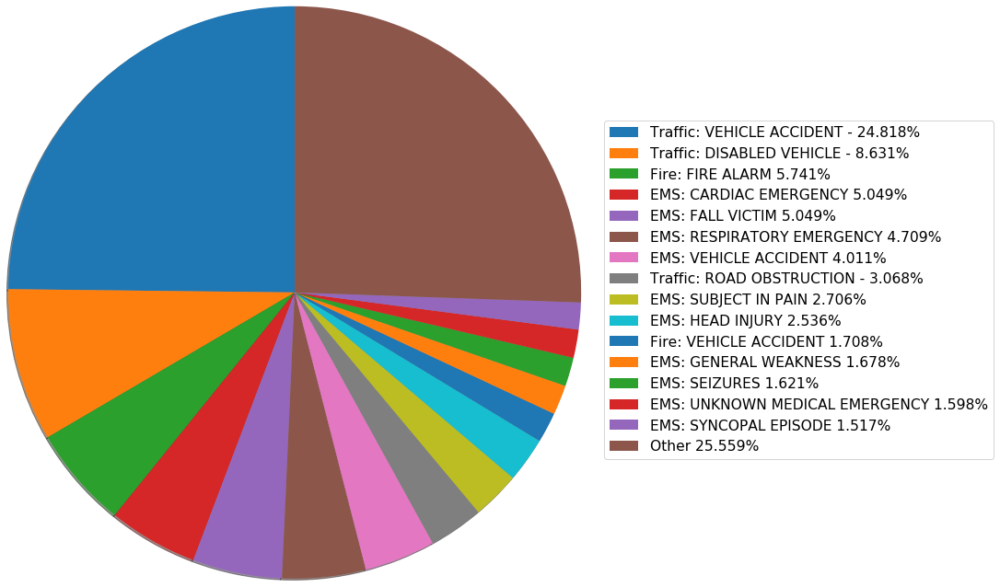

Friday


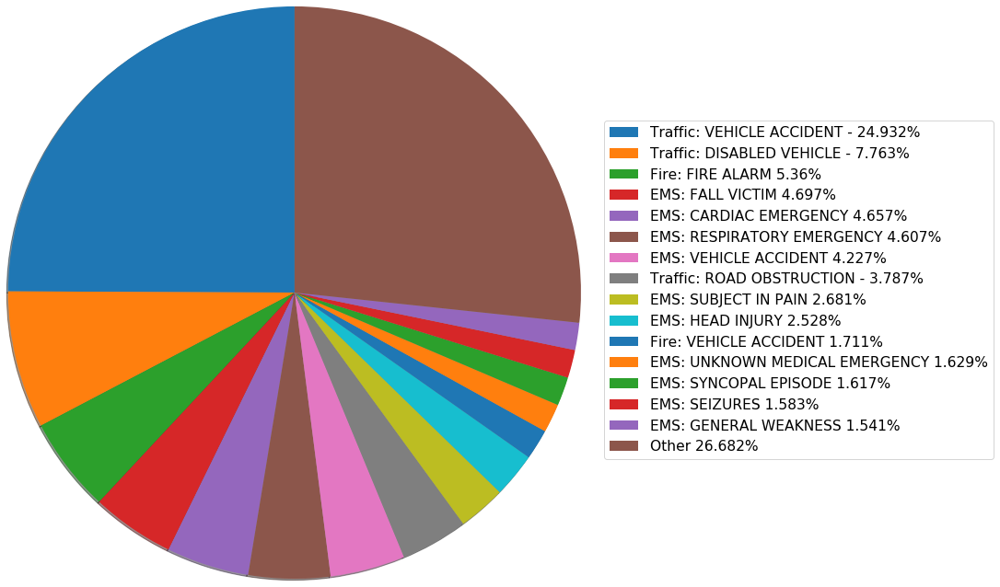

Saturday


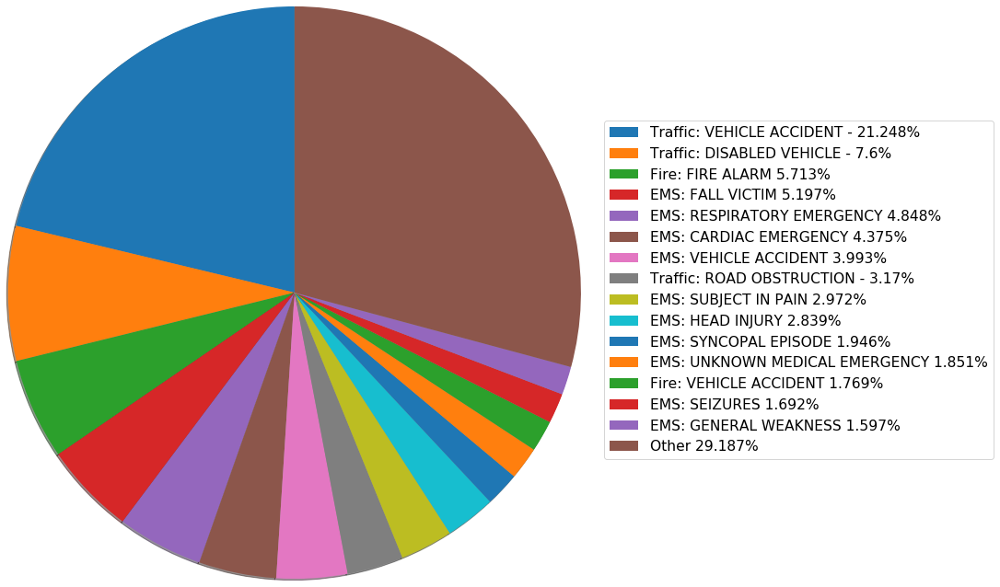

Sunday


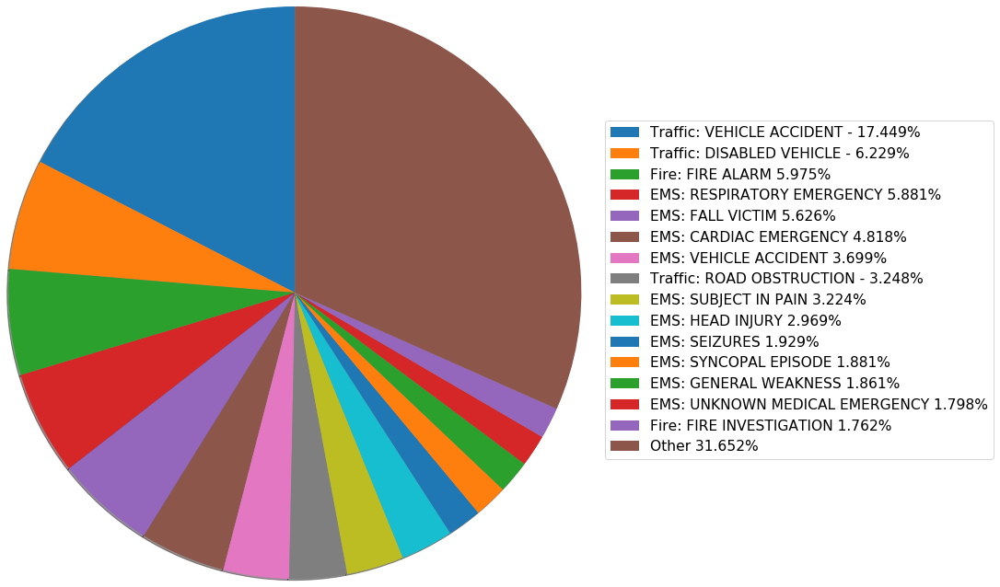

Monday


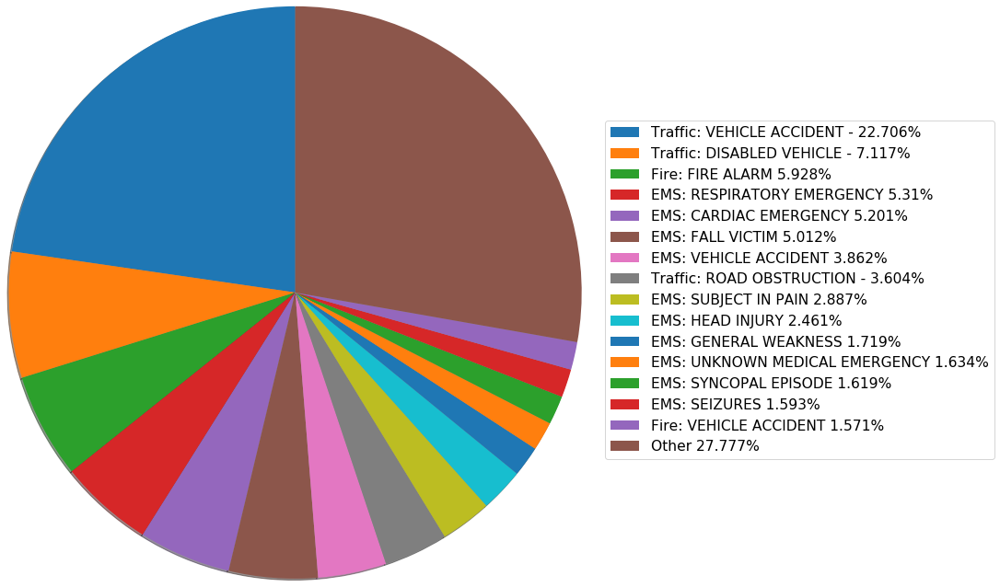

Tuesday


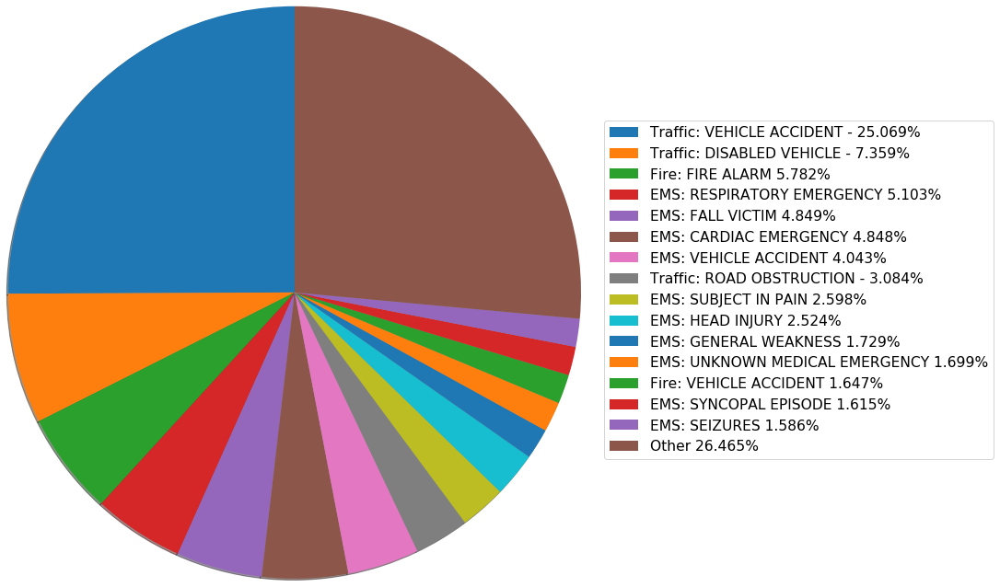

Wednesday


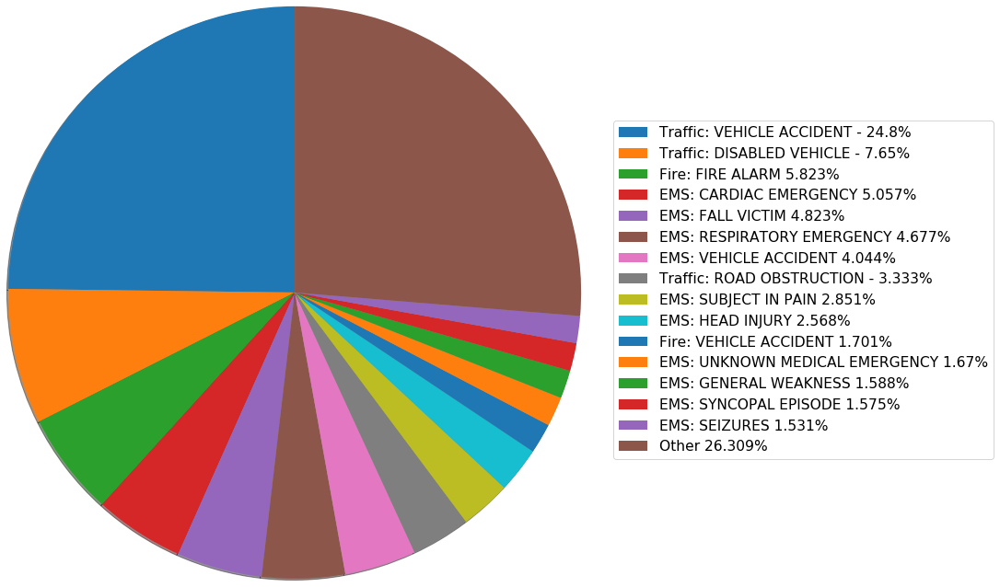

In [19]:
#for each day of the week put values in piechart
for day in wkDayDist:
    #piechart variables
    print(day)
    labels = []
    sizes = []
    
    #group calls in piechart
    for data in wkDayDist[day]:
        temp = ( wkDayDist[day][data] / wkDayCount[day] )*100
        labels.append(data + " " + str(round(temp,3)) + "%")
        sizes.append(wkDayDist[day][data])
    
    #reverse sort values and store top 15
    L = sorted(zip(labels,sizes), key=operator.itemgetter(1), reverse=True)
    labels, sizes = zip(*L)
    lTop15 = list(labels[0:15])
    sTop15 = list(sizes[0:15])
    
    #Store remaining values as other in piechart
    s = 0
    for i in range(15, len(sizes)):
        s += sizes[i]
    temp = (s / wkDayCount[day]) * 100
    lTop15.append("Other " + str(round(temp,3)) + "%")
    sTop15.append(s)
    
    #Create piechart
    patches, texts = plt.pie(sTop15,shadow=True, startangle=90, radius=4)

    plt.legend(patches, labels=lTop15, loc='center right', bbox_to_anchor=(2, 0.5),fontsize=15.5,bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.1, right=0.45)
    plt.savefig(day+'.png', bbox_inches='tight')
    plt.show()

# Objective 11: 
Analyze each categories sub-categories and place values in a pie chart. Example EMS : percentage which of head injuries, the percentage of respiratory, etc.

In [20]:
subCatCounter = Counter()
#store category names
catLabels = defaultdict(list)
#set of tuples to prevent duplicate storage stores (cat, subCat)
seen = set()


for row in df.index:
    #get category and subcategory
    value = df.loc[row]["title"]
    cat = value[:value.find(":")]
    subCat = value[value.find(":") + 2:]
    
    if (cat, subCat) not in seen:
        seen.add((cat, subCat))
        catLabels[cat].append((cat,subCat))
        
    subCatCounter[(cat, subCat)] += 1

EMS


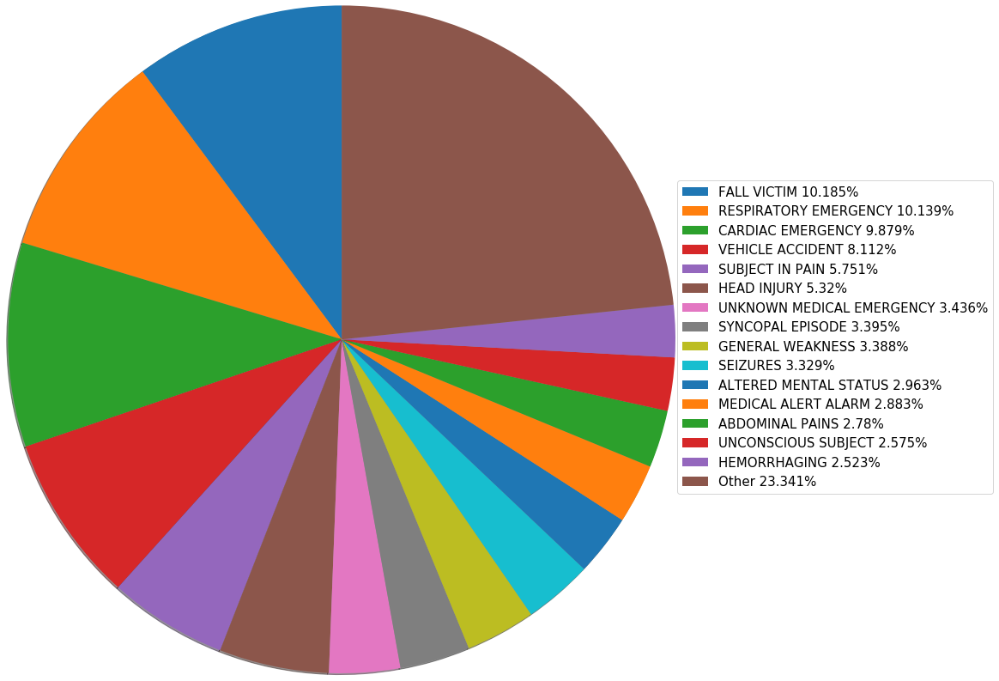

Fire


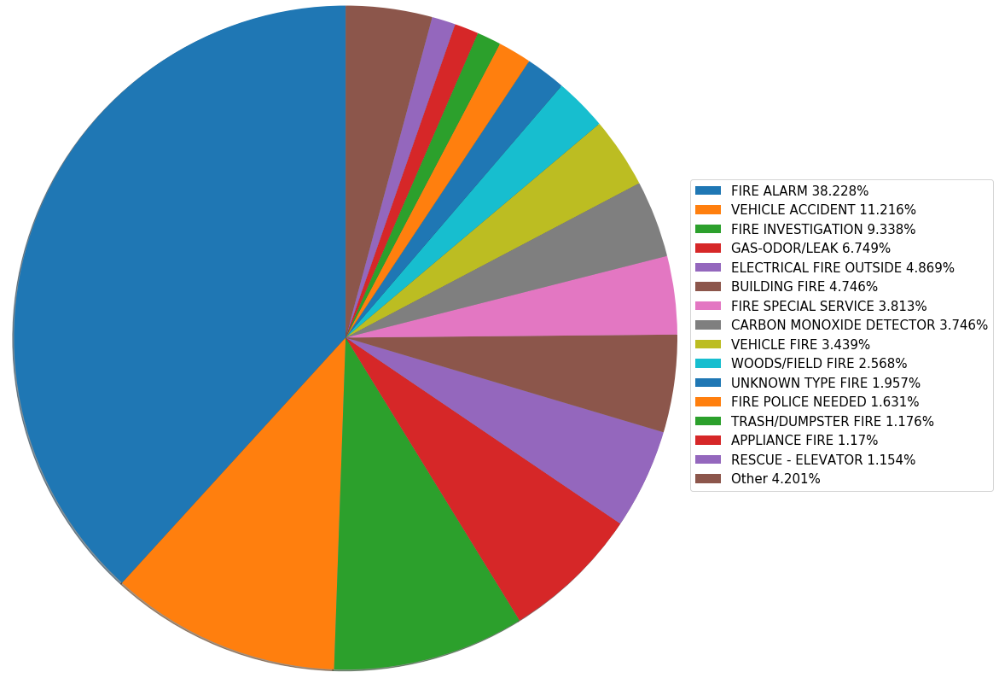

Traffic


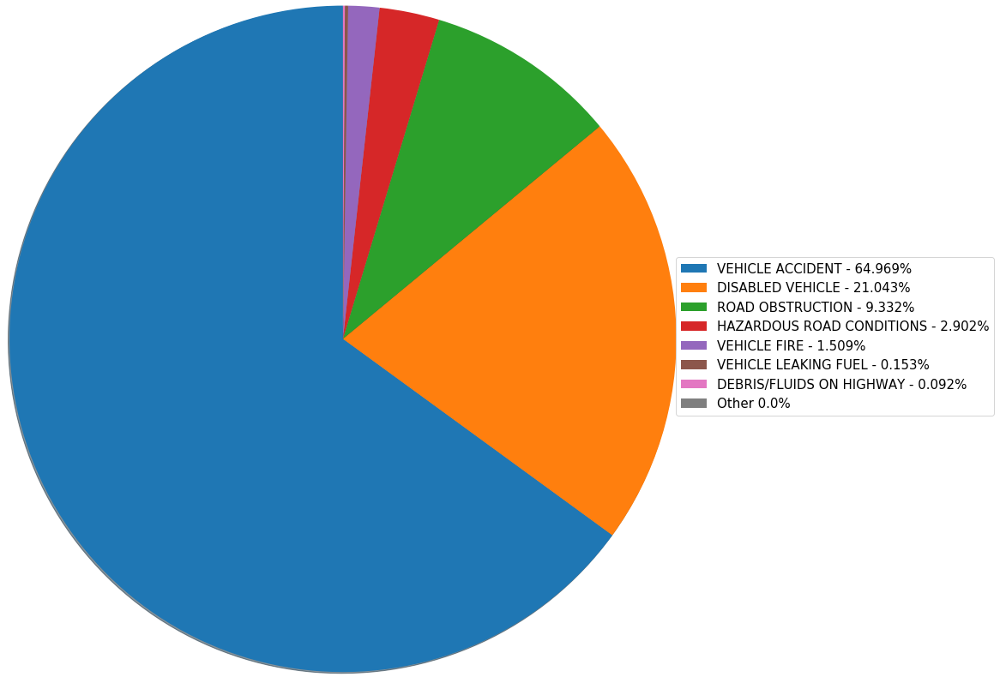

In [21]:
#Double check variable
#total = 0

#Piechart Variables
labels = []
sizes = []
for key in catLabels:
    print(key)
    for val in catLabels[key]:
        #total += subCatCounter[(key, val[1])]    ***** uncomment this line to check totals
        temp = (subCatCounter[(key, val[1])]/totals[key])*100
        #total += temp                    ***** uncomment this line to check percents
        labels.append(val[1] + " " + str(round(temp,3)) + "%")
        sizes.append(subCatCounter[(key, val[1])])
    
    #reverse sort values and store top 15
    L = sorted(zip(labels,sizes), key=operator.itemgetter(1), reverse=True)
    labels, sizes = zip(*L)
    
    lTop15 = list(labels[0:15])
    sTop15 = list(sizes[0:15])
    
    #Store remaining values as other in piechart
    s = 0
    for i in range(15, len(sizes)):
        s += sizes[i]
    temp = (s / totals[key])*100
    lTop15.append("Other " + str(round(temp,3)) + "%")
    sTop15.append(s)
    
    #Create piechart
    patches, texts = plt.pie(sTop15,shadow=True, startangle=90, radius=5)

    plt.legend(patches, labels=lTop15, loc='center right', bbox_to_anchor=(2, 0.5),fontsize=15,bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.1, right=0.45)
    plt.savefig(key+'.png', bbox_inches='tight')
    plt.show()
    
    labels = []
    sizes = []
    #print(total, totals[key], total == totals[key])     ***** uncomment this line to check totals
    #print(total)                                        ***** uncomment this line to check percents
    #total = 0

1. Day and Night Call Reports - frequency of when which type of call is prominent at what time of the day 
   
       a. When do they most likely occur (morning, noon, afternoon, evening night)
       b. What are the number of Occurrences per Reason
       
2. The dispersion of Traffic/EMS/Fire Occurrences per week over the years

3. The total number of hourly calls in all years

       a. Compare percent increase in frequency
       b. Predict trend for the future (maybe a Linear regression?)

In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
import calendar
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.plotly as py
import plotly.graph_objs as go

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from matplotlib import colors
from matplotlib.font_manager import FontProperties
from folium.plugins import HeatMap
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

sns.set_style('darkgrid')
init_notebook_mode(connected=True)

In [4]:
df = pd.read_csv('911.csv', ',')

df['Type'] = df['title'].apply(lambda s:s.split(':')[0])
df['Reason'] = df['title'].apply(lambda s:s.split(':')[1])

In [3]:
table = [["Type","Qualitative Nominal"],["Reason","Qualitative Nominal"],["Week","Qualitative Nominal"],
            ["Week_Abbr","Qualitative Nominal"],["Month","Discrete Quantitative"],["Month_Abbr","Discrete Quantitative"],
            ["Year","Discrete Quantitative"],["Hour","Discrete Quantitative"],["timeStamp","Qualitative Ordinal"],
            ["Day","Qualitative Ordinal"],["Date","Discrete Quantitative"],["day/night","Qualitative Nominal"]]

filing = pd.DataFrame(table, columns=["Variable", "Classification"])
filing


,Variable,Classification
0,Type,Qualitative Nominal
1,Reason,Qualitative Nominal
2,Week,Qualitative Nominal
3,Week_Abbr,Qualitative Nominal
4,Month,Discrete Quantitative
5,Month_Abbr,Discrete Quantitative
6,Year,Discrete Quantitative
7,Hour,Discrete Quantitative
8,timeStamp,Qualitative Ordinal
9,Day,Qualitative Ordinal


# Objective 12
Day and Night Call Reports - frequency of when which type of call is prominent at what time of the day 
   
       a. When do they most likely occur (morning, noon, afternoon, evening night)
       b. What are the number of Occurrences per Reason

In [6]:
#Creating lists with the Names of the Week and the Months

wday = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
months = ['','January','February','March','April','May','June','July','August','September','October','November','December']

#Converting to datetime and creating hour / hour, day / day, month / month, year / year, week / week

df['timeStamp'] = pd.to_datetime(df['timeStamp'])
df['Hour'] = df['timeStamp'].apply(lambda x: x.hour)
df['Day'] = df['timeStamp'].apply(lambda x: x.day)
df['Month'] = df['timeStamp'].apply(lambda x: x.month)
df['Month_Abbr'] = df['timeStamp'].apply(lambda x: months[x.month])
df['Year'] = df['timeStamp'].apply(lambda x: x.year)
df['Week'] = df['timeStamp'].apply(lambda x: x.weekday())
df['Week_Abbr'] = df['timeStamp'].apply(lambda x: wday[x.weekday()])
df['Date']=df['timeStamp'].apply(lambda x:x.date())
df["day/night"] = df["timeStamp"].apply(lambda x : "night" if int(x.strftime("%H")) > 19 else "day")

In [7]:
def timeZone(timestamp):
    hour = timestamp.hour
    if (hour > 6 and hour < 12) or hour == 6:
        return 'Morning'
    elif hour == 12:
        return 'Noon'
    elif hour > 12 and hour < 17:
        return 'Afternoon'
    elif (hour > 17 and hour < 21) or hour == 17:
        return 'Evening'
    elif (hour > 21 and hour < 6) or hour == 21:
        return 'Night'

In [8]:
df['timezone'] = df['timeStamp'].apply(lambda x : timeZone(x))

(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

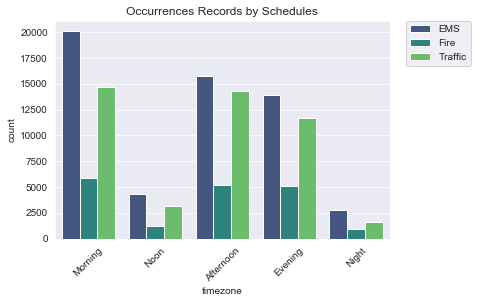

In [10]:
sns.countplot('timezone', data = df[df['Year'] == 2016],palette="viridis", hue= "Type" )
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Occurrences Records by Schedules")
plt.xticks(rotation=45)

In [11]:
v0 = df[(df['title']=='Traffic: VEHICLE ACCIDENT -')].Hour.values
data = [go.Histogram(x=v0,histnorm='probability')]

layout = dict(title='Traffic: VEHICLE ACCIDENT (hr)',
            autosize= True,bargap= 0.015,height= 400,width= 500,hovermode= 'x',xaxis=dict(autorange= True,zeroline= False),
            yaxis= dict(autorange= True,showticklabels= True,))

fig1 = dict(data=data, layout=layout)
iplot(fig1)


In [12]:
v0 = df['timezone'].values
data = [go.Histogram(x=v0,histnorm='probability')]

layout = dict(title='Traffic: VEHICLE ACCIDENT (hr)',
            autosize= True,bargap= 0.015,height= 400,width= 500,hovermode= 'x',xaxis=dict(autorange= True,zeroline= False),
            yaxis= dict(autorange= True,showticklabels= True,))

fig1 = dict(data=data, layout=layout)
iplot(fig1)

    b. What are the number of Occurrences per Reason

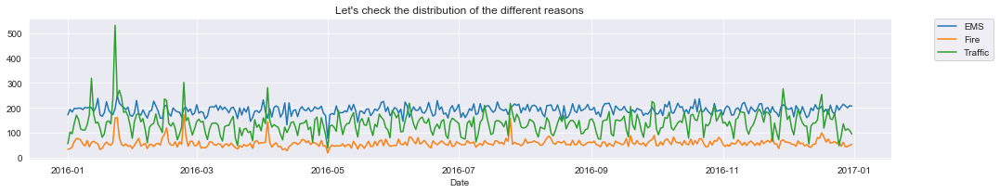

In [8]:
df[(df['Type']=='EMS') & (df['Year'] == 2016)].groupby('Date').count()['twp'].plot(figsize=(15,3),label='EMS')
df[(df['Type']=='Fire') & (df['Year'] == 2016)].groupby('Date').count()['twp'].plot(figsize=(15,3),label='Fire')
df[(df['Type']=='Traffic') & (df['Year'] == 2016)].groupby('Date').count()['twp'].plot(figsize=(15,3),label='Traffic')
plt.title("Let's check the distribution of the different reasons")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

# Objective 13
The total number of hourly calls in all years

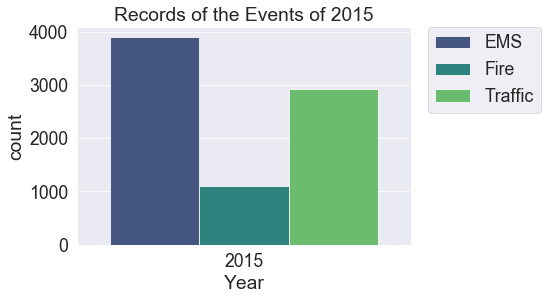

In [11]:
sns.set_context("paper", font_scale = 2)
sns.countplot(x= "Year", data= df[df['Year'] == 2015], palette="viridis", hue = "Type")
plt.title("Records of the Events of 2015")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

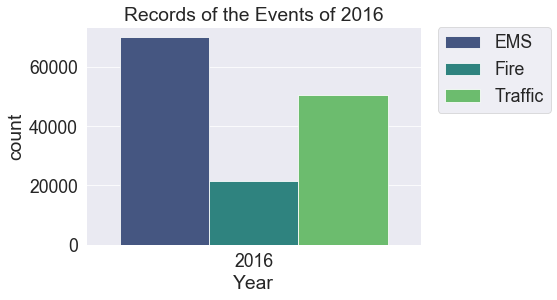

In [12]:
sns.set_context("paper", font_scale = 2)
sns.countplot(x= "Year", data= df[df['Year'] == 2016], palette="viridis", hue = "Type")
plt.title("Records of the Events of 2016")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

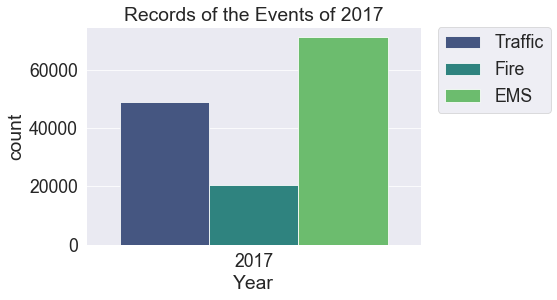

In [14]:
sns.set_context("paper", font_scale = 2)
sns.countplot(x= "Year", data= df[df['Year'] == 2017], palette="viridis", hue = "Type")
plt.title("Records of the Events of 2017")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


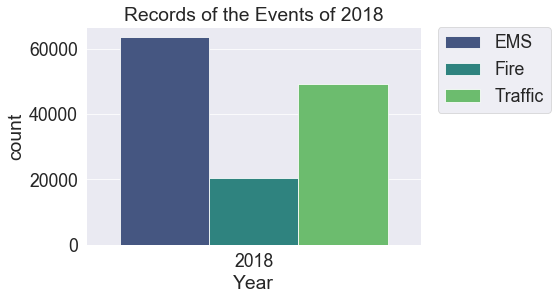

In [15]:
sns.set_context("paper", font_scale = 2)
sns.countplot(x= "Year", data= df[df['Year'] == 2018], palette="viridis", hue = "Type")
plt.title("Records of the Events of 2018")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Objective 14
The dispersion of Traffic/EMS/Fire Occurrences per week over the years

In [16]:
W1 = df[(df['Type'] == 'Traffic') & (df['Week'] == 0)].groupby(['Hour']).size().reset_index(name='Qty')
W2 = df[(df['Type'] == 'Traffic') & (df['Week'] == 1)].groupby(['Hour']).size().reset_index(name='Qty')
W3 = df[(df['Type'] == 'Traffic') & (df['Week'] == 2)].groupby(['Hour']).size().reset_index(name='Qty')
W4 = df[(df['Type'] == 'Traffic') & (df['Week'] == 3)].groupby(['Hour']).size().reset_index(name='Qty')
W5 = df[(df['Type'] == 'Traffic') & (df['Week'] == 4)].groupby(['Hour']).size().reset_index(name='Qty')
W6 = df[(df['Type'] == 'Traffic') & (df['Week'] == 5)].groupby(['Hour']).size().reset_index(name='Qty')
W7 = df[(df['Type'] == 'Traffic') & (df['Week'] == 6)].groupby(['Hour']).size().reset_index(name='Qty')

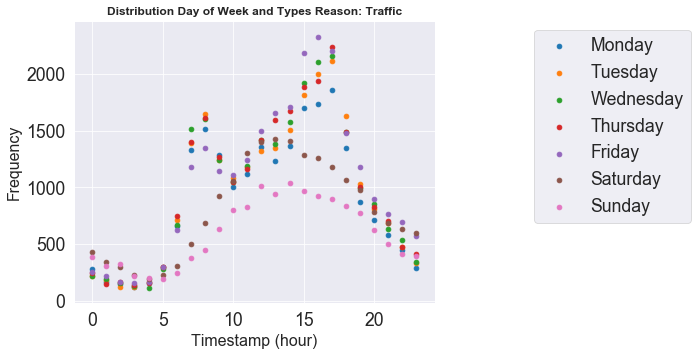

In [17]:

# Dispersion
fig, ax = plt.subplots(figsize=(16, 10))

# Set up the plot
ax = plt.subplot(2, 2, 1)

ax.scatter(W1['Hour'], W1['Qty'], label="Monday")
ax.scatter(W2['Hour'], W2['Qty'], label="Tuesday")
ax.scatter(W3['Hour'], W3['Qty'], label="Wednesday")
ax.scatter(W4['Hour'], W4['Qty'], label="Thursday")
ax.scatter(W5['Hour'], W5['Qty'], label="Friday")
ax.scatter(W6['Hour'], W6['Qty'], label="Saturday")
ax.scatter(W7['Hour'], W7['Qty'], label="Sunday")
ax.legend(loc='best')
ax.legend(bbox_to_anchor=(1.25, 1.0))
ax.set_xlabel('Timestamp (hour)', fontsize=16,)
ax.set_ylabel('Frequency', fontsize=16)
ax.set_title('Distribution Day of Week and Types Reason: Traffic', fontsize=12, fontweight='bold')

fig.tight_layout(pad=1.5, w_pad=2, h_pad=2.0)